In [1]:
import pandas as pd
import datetime as dt #for setting starting and ending dates
import numpy as np
import matplotlib.pyplot as plt #for visualisation
import scipy.stats as stats #for plots
import plotly.offline as pyo
import quandl
import yfinance as yf #for fetching real time data of stocks
import pylab
import seaborn as sns #built on top of matplotlib and is useful in providing useful interface for showing results
from datetime import datetime #for data retrival of MnC's finances
from pandas_datareader import data 

pd.options.plotting.backend='plotly'
pyo.init_notebook_mode(connected='True')

In [2]:
#Here we imported all the packages need for the analysis

In [3]:
#Setting the begining and ending dates
today=datetime.now()
year_ago=datetime(today.year-1,today.month,today.day) #starting date= one yr prior to current date

In [4]:
#Next we set the current datetime to today's and the time duration to 1year

In [8]:
GS=pd.read_csv("GS.csv")
JPM=pd.read_csv("JPM.csv")
MS=pd.read_csv("MS.csv")
EVR=pd.read_csv("EVR.csv")
LAZ=pd.read_csv("LAZ.csv")

#FIVE companies choosed for data extraction
company_list=['GS','JPM','MS','EVR','LAZ']

In [9]:
#Next, we fetch the financial data of several companies we are intrested in.
#We may also use yfinance to get real time data of stocks within the time frame (I have showed its use
#too, in the end)

In [12]:
GS.head(15)
#fIrst five rows of twitter's finance dataset
#To see how it is structured 

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-08-26,198.270004,199.710007,198.000000,199.649994,176.469376,1441900
1,2019-08-27,200.330002,200.860001,196.500000,198.070007,175.072845,1513300
2,2019-08-28,196.570007,201.470001,196.250000,200.419998,177.150024,1437800
3,2019-08-29,201.360001,204.369995,201.360001,203.440002,180.947922,1816800
4,2019-08-30,204.850006,205.210007,203.009995,203.910004,181.365952,1529600
5,2019-09-03,201.100006,201.610001,196.580002,198.970001,176.972122,2633600
6,2019-09-04,201.490005,202.100006,200.050003,201.729996,179.426987,1720600
7,2019-09-05,205.270004,208.929993,205.039993,207.050003,184.158783,2237900
8,2019-09-06,207.059998,208.250000,205.570007,207.210007,184.301102,1438800
9,2019-09-09,209.220001,213.880005,208.440002,211.979996,188.543747,2734500


In [13]:
#It shows the first 15 columns of the financial record of the choosenn stock, it helps us to analyze how the data is categorised and understand it's distribution.

In [14]:
JPM.head(15)


,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-08-26,106.620003,106.989998,106.010002,106.870003,92.316597,8209500
1,2019-08-27,107.349998,107.559998,104.839996,105.739998,91.340492,14331800
2,2019-08-28,105.080002,107.209999,105.040001,106.800003,92.256134,10585500
3,2019-08-29,108.139999,109.889999,108.019997,109.220001,94.346565,10002200
4,2019-08-30,109.839996,110.559998,109.470001,109.860001,94.899406,10170300
5,2019-09-03,108.980003,108.989998,107.320000,108.559998,93.776451,9868800
6,2019-09-04,109.449997,110.220001,108.559998,109.870003,94.908051,6929200
7,2019-09-05,111.250000,113.720001,111.199997,112.370003,97.067604,13224700
8,2019-09-06,112.660004,112.980003,111.959999,112.610001,97.274925,7836600
9,2019-09-09,113.709999,116.059998,113.599998,115.400002,99.684982,13985100


In [15]:
MS.head(15)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-08-26,39.840000,40.270000,39.700001,40.160000,34.180939,10408600
1,2019-08-27,40.250000,40.340000,39.450001,39.790001,33.866016,8742900
2,2019-08-28,39.400002,40.700001,39.349998,40.380001,34.368179,9881900
3,2019-08-29,40.889999,41.500000,40.869999,41.290001,35.142700,12191900
4,2019-08-30,41.680000,41.869999,41.299999,41.490002,35.312920,7427000
5,2019-09-03,41.040001,41.090000,40.349998,40.990002,34.887363,8675300
6,2019-09-04,41.439999,41.689999,41.299999,41.529999,35.346962,6829900
7,2019-09-05,42.299999,43.110001,42.299999,42.470001,36.147007,8101600
8,2019-09-06,42.470001,42.549999,42.009998,42.180000,35.900196,7012700
9,2019-09-09,42.540001,43.490002,42.540001,43.110001,36.691730,11888800


In [16]:
EVR.head(15)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-08-26,77.559998,77.889999,76.180000,77.180000,68.076286,257500
1,2019-08-27,77.739998,77.739998,75.059998,75.919998,66.964935,399100
2,2019-08-28,75.660004,77.500000,75.419998,76.949997,67.873444,197900
3,2019-08-29,77.720001,79.269997,77.720001,79.080002,70.281921,277300
4,2019-08-30,79.629997,80.029999,78.949997,79.760002,70.886261,445000
5,2019-09-03,79.209999,79.620003,76.540001,77.400002,68.788841,495800
6,2019-09-04,78.449997,78.610001,77.209999,78.360001,69.642021,421900
7,2019-09-05,79.809998,80.980003,79.720001,79.839996,70.957382,275800
8,2019-09-06,79.809998,79.980003,78.199997,78.480003,69.748688,449200
9,2019-09-09,79.230003,81.260002,79.099998,80.540001,71.579491,567200


In [18]:
LAZ.head(15)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-08-26,33.799999,34.320000,33.549999,33.959999,26.097960,720500
1,2019-08-27,34.160000,34.230000,33.389999,33.680000,25.882780,382200
2,2019-08-28,33.410000,33.910000,32.419998,33.730000,25.921202,675000
3,2019-08-29,34.180000,34.349998,34.000000,34.279999,26.343868,246900
4,2019-08-30,34.500000,34.709999,34.119999,34.340000,26.389982,315400
5,2019-09-03,34.029999,34.150002,33.250000,33.689999,25.890463,858100
6,2019-09-04,34.110001,34.430000,33.950001,34.320000,26.374613,369400
7,2019-09-05,34.860001,35.970001,34.799999,35.480000,27.266062,648700
8,2019-09-06,35.599998,36.380001,35.439999,35.799999,27.511980,767700
9,2019-09-09,36.130001,37.439999,36.020000,37.250000,28.626293,777300


In [19]:
GS.info()
#column datatypes, data stored in dataframe, gives a brief summary of the insights

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1258 non-null   object 
 1   Open       1258 non-null   float64
 2   High       1258 non-null   float64
 3   Low        1258 non-null   float64
 4   Close      1258 non-null   float64
 5   Adj Close  1258 non-null   float64
 6   Volume     1258 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 68.9+ KB


In [20]:
#info() gives us more insights into the dataset, its dimensions, its class, number of entries etc

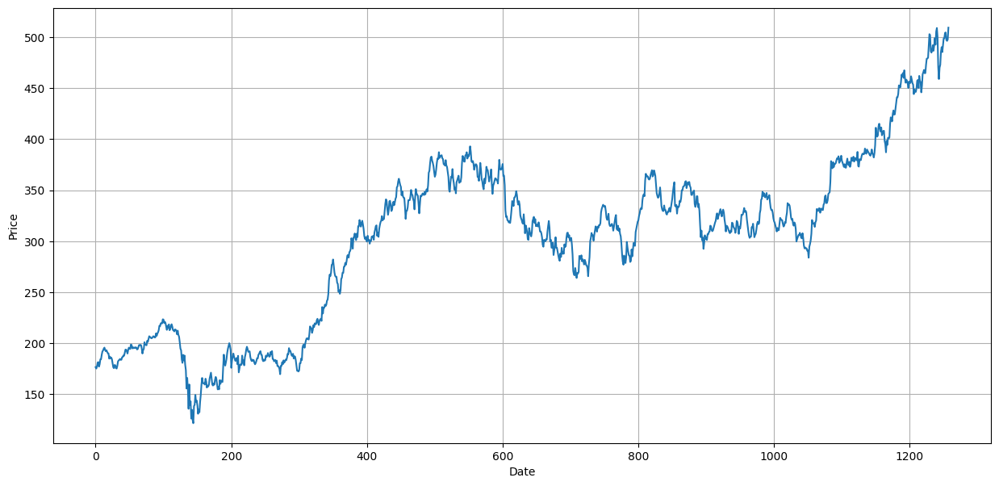

In [25]:
plt.figure(figsize=(15,7))
plt.plot(GS['Adj Close'])
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid()
plt.show()

In [26]:
#Here our main focus is on "Adjusted Close" section of the data, it means the cash value of the last transacted price before the market closes. The adjusted closing price is attributed to anything that would affect the stock price after the market closes for the day. 

In [35]:
print('First',GS.Close[0],'End', GS.Close[1257]) 
#Here we can see how the prices varied, intial vs closing

First 199.649994 End 509.420013


In [36]:
#Above is the starting and ending price of the asset choosen within the timeframe

In [37]:
# We can also compute log returns as its time additive
log_returns=np.log(GS.Close/GS.Close.shift(1)).dropna() #we also dropped the nans 
log_returns

1      -0.007945
2       0.011795
3       0.014956
4       0.002308
5      -0.024525
          ...   
1253    0.000833
1254   -0.014651
1255   -0.001771
1256    0.002595
1257    0.023175
Name: Close, Length: 1257, dtype: float64

In [38]:
log_returns.mean() #take the mean of log_Rreturns

np.float64(0.0007451925582449724)

In [39]:
GS.Close[0]*(np.exp(log_returns.mean()*len(log_returns)))

np.float64(509.42001300000175)

In [40]:
float(GS.Close[0]*(np.exp(log_returns.mean()*len(log_returns))))

509.42001300000175

In [41]:
#Above, we find the closing price of METlife using log returns.

In [42]:
#As we can see it accurately predicted the closing price of the time series. It can't be done by simple returns as if we want to model returns using the normal distribution!

#Simple Returns: The product of normally distributed variables is not normally distributed.
#Log Returns: The sum of normally distributed variables folllow a normal distribution.

In [43]:
# Lets try to calculate the same using simple returns and see how it compares
simple_returns=GS.Close.pct_change().dropna() # we also dropped the NaNs using dropna()
simple_returns

1      -0.007914
2       0.011864
3       0.015068
4       0.002310
5      -0.024226
          ...   
1253    0.000833
1254   -0.014544
1255   -0.001769
1256    0.002598
1257    0.023446
Name: Close, Length: 1257, dtype: float64

In [44]:
float(simple_returns.mean()) # calculate the mean of simple_returns

0.0009541350766056757

In [45]:
GS.Close[0]*(np.prod([(1+Rt) for Rt in simple_returns]))

np.float64(509.42001300000203)

In [47]:
float(GS.Close[0]*(np.prod([(1+Rt) for Rt in simple_returns])))

509.42001300000203

In [49]:
#Above, we find the closing price of Goldman Sachs using simple returns.

In [50]:
#As we see by simple returns the prediction is close to the actually closing price but not accurately close, also its very non-intutive to follow through

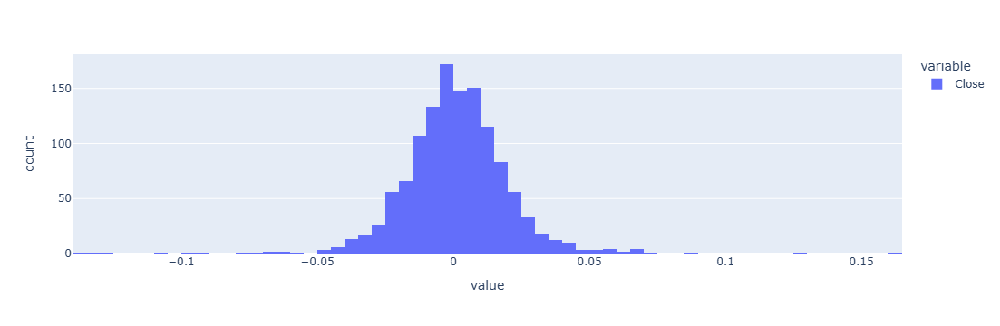

In [51]:
#Histogram of log returns
log_returns.plot(kind='hist')

In [52]:
#As we can see it's mostly centered around 0, looks a bit normally distributed. But there is quite a catch here is normality a good assumption for financial data? The assumption that prices or more accurately log returns are normally distributed.

In [54]:
# lets take the best and the worst case and see the std deviation and the probability of occurances if its assumed to be normal
log_returns_sorted=log_returns.tolist()
log_returns_sorted.sort()
# Here we sorted all the log returns according to their value,
# to get the lowest and the highest case (the leftmost and the Rightmost case in the Histogram)

worst=log_returns_sorted[0]
best=log_returns_sorted[-1]

std_worst=(worst-log_returns.mean())/log_returns.std()
std_best=(best-log_returns.mean())/log_returns.std()
# here we normalise it

print('Std dev. worst %.4f best %.4f' %(std_worst,std_best))

Std dev. worst -6.6849 best 7.8876


In [55]:
#As we can see the deviation is huge, as in normal distribution about 99.75% of the data is within 3 standard deviations, which is just not the case here.

In [56]:
#Testing for normality

In [57]:
#Q-Q or Quantile-Quantile Plots

#It plots two sets of quantiles against one another i.e. theoritical quantiles against actual quantiles of the variable.

Q-Q PLOT


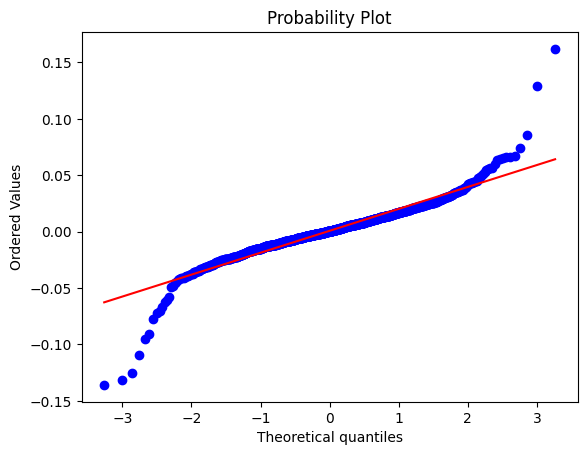

In [58]:
stats.probplot(log_returns, dist='norm', plot=pylab)
print('Q-Q PLOT')

In [59]:
#As we can see from here normally treating financial data as normally distributed is not a bad assumption for the most part, except for the tails. Which we can see from the plot as well, at the tails and heads there seems a deviation from normality.

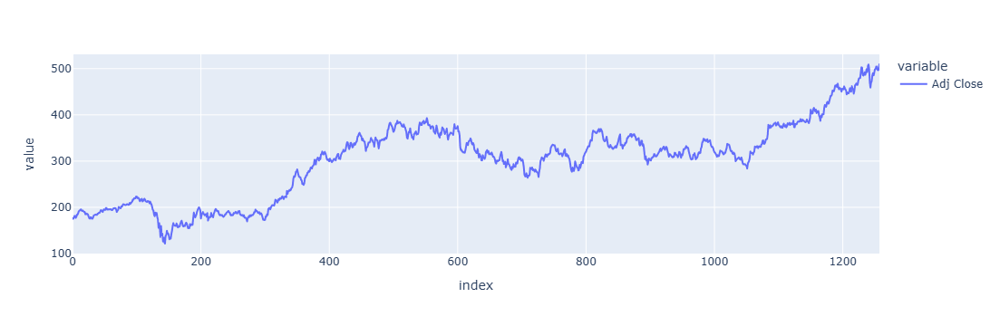

In [60]:
GS['Adj Close'].plot()

In [61]:
#We do the same for other assets as well, it would help us to annalyse how it is varrying wrt days

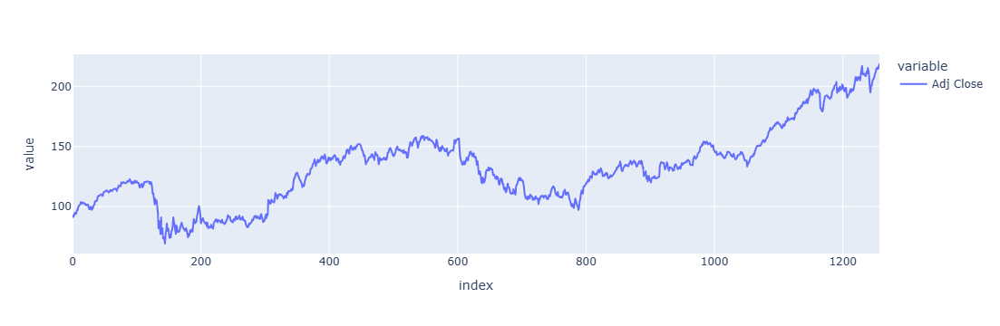

In [62]:
JPM['Adj Close'].plot()

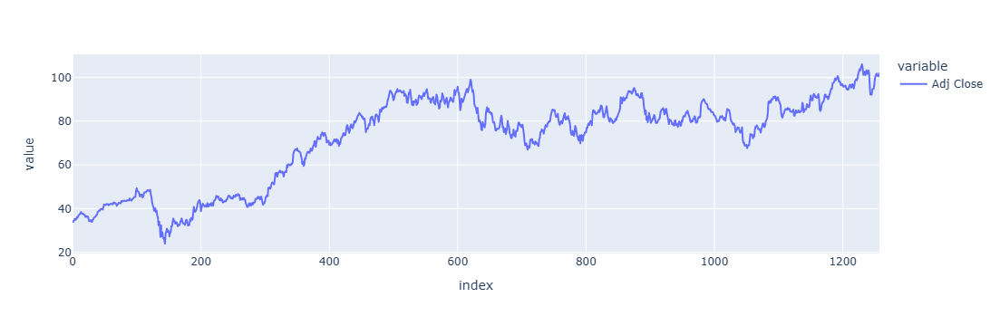

In [63]:
MS['Adj Close'].plot()

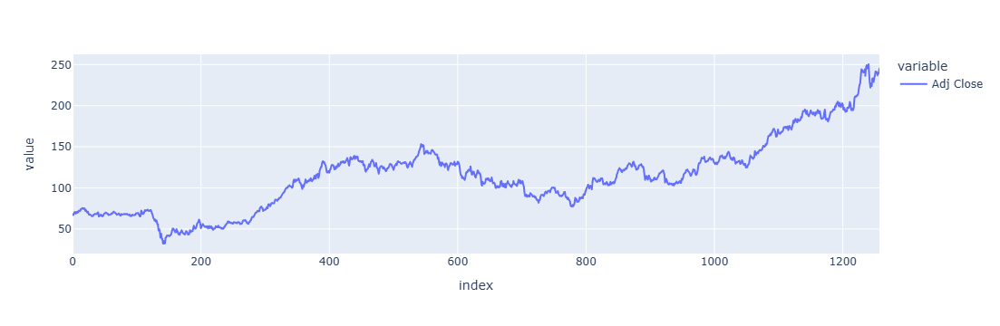

In [64]:
EVR['Adj Close'].plot()

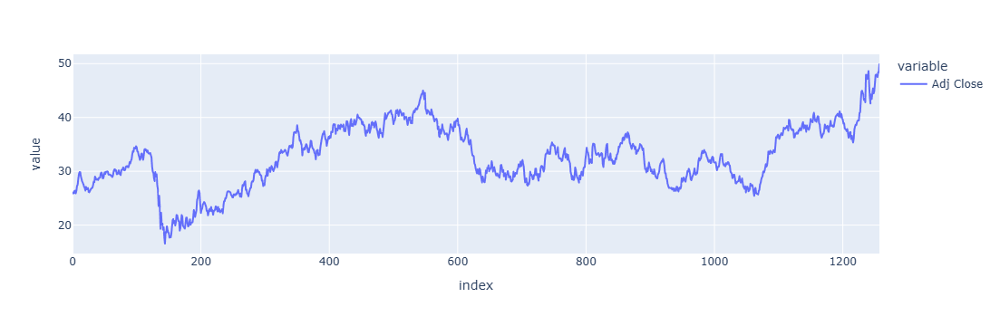

In [65]:
LAZ['Adj Close'].plot()

In [66]:
#We then incorporate moving averages to eliminate fluctuations and this process is called smoothing of time series. It reduces the amount of variations present in the data. The main advantage of SMA is that it offers a smoothed line, less prone to whipsawing. Its often favoured by traders operating on longer time frames such as daily or weekly charts

In [68]:
#Number of days for which moving average will be calculated
MA_days = [10, 20, 30, 50, 100, 365]

for ma in MA_days:
    ma_str = "MA: {}".format(ma)
    GS[ma_str] = GS['Adj Close'].rolling(ma).mean()
    JPM[ma_str] = JPM['Adj Close'].rolling(ma).mean()
    MS[ma_str] = MS['Adj Close'].rolling(ma).mean()
    EVR[ma_str] = EVR['Adj Close'].rolling(ma).mean()
    LAZ[ma_str] = LAZ['Adj Close'].rolling(ma).mean()

In [69]:
#This code calculates the moving averages (MA) for a given set of days (10, 20, and 30) for the 'Adj Close' price data

In [76]:
def plot_graphic(company, company_string):
    plt.figure(figsize=(15, 6))
    plt.plot(company['Adj Close'])
    plt.plot(company['MA: 10'])
    plt.plot(company['MA: 20'])
    plt.plot(company['MA: 30'])
    plt.plot(company['MA: 50'])
    plt.plot(company['MA: 100'])
    plt.plot(company['MA: 365'])
    
    plt.title(company_string)
    plt.xlabel('Date')
    plt.ylabel('Price')

    plt.legend(('Adj Close','MA: 10', 'MA: 20', 'MA:30', 'MA:50', 'MA:100', 'MA:365'))
    plt.grid()
    plt.show()

In [77]:
#For a specified company's stock market data, the code defines a function called plot_graphic, which creates a graph illustrating the adjusted closing prices and three moving averages (MA: 10, MA: 20, and MA: 30). The function takes two parameters: company, which represents the data for the company, and company_string, which represents the company's name.


#An effective way to visualize adjusted closing prices and moving averages of a specific company's stock market data is to use the plot_graphic function. Over time, it makes it easier to analyze and compare price trends.

#The more days we incorporate the more smoothing we get, which can be seen in the graph below.

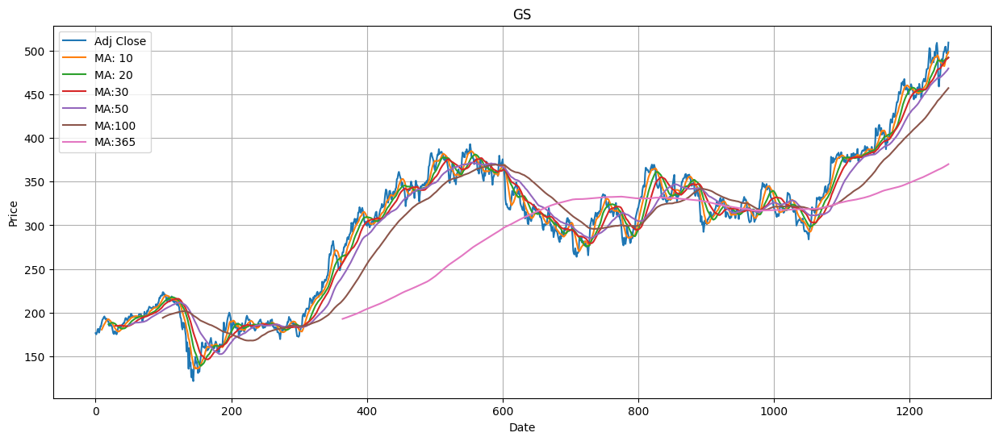

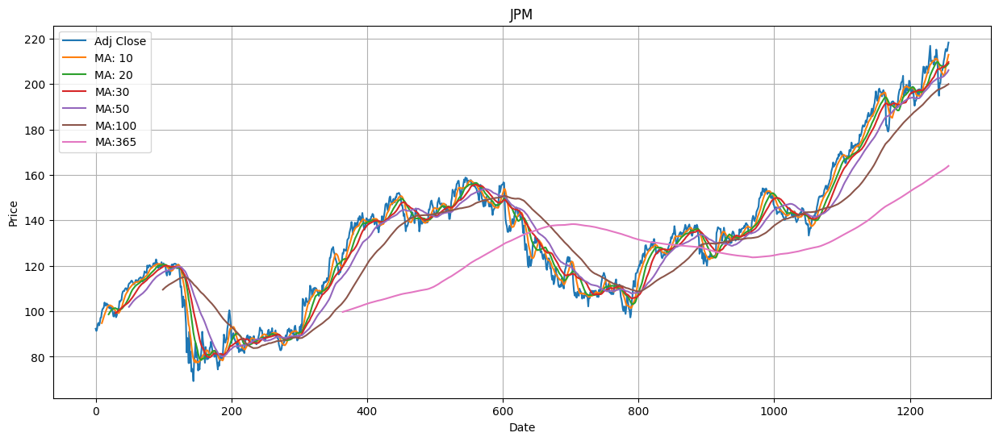

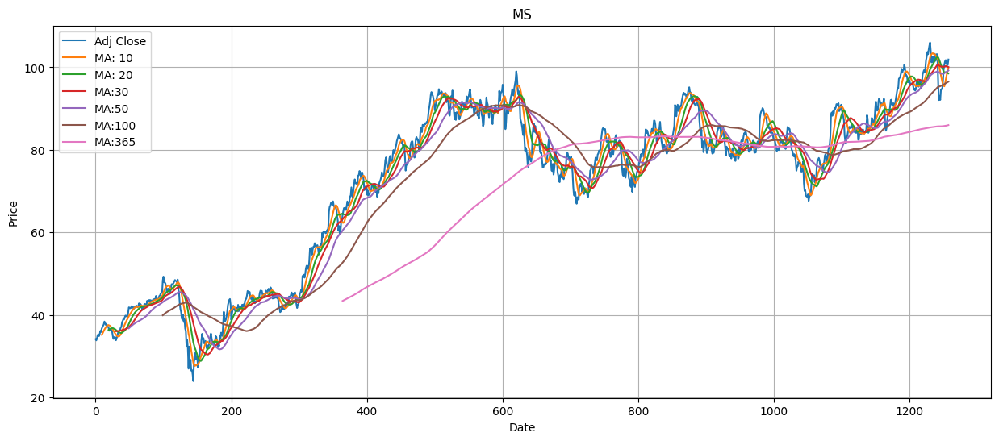

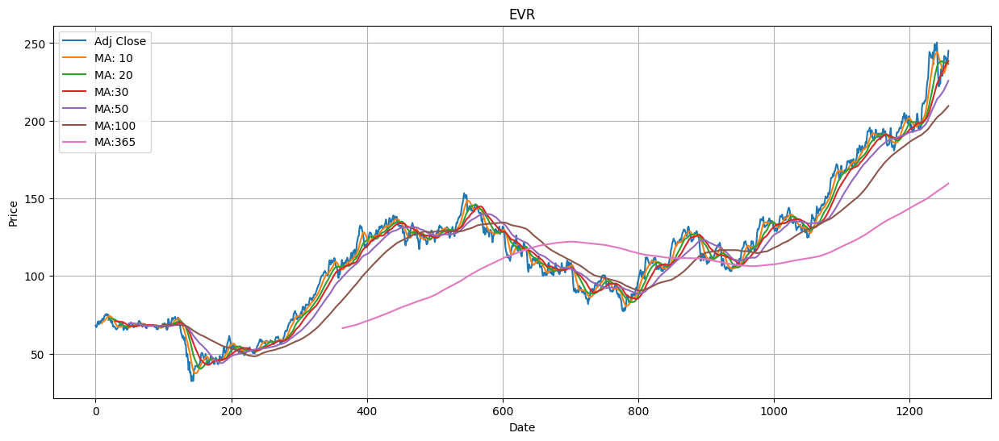

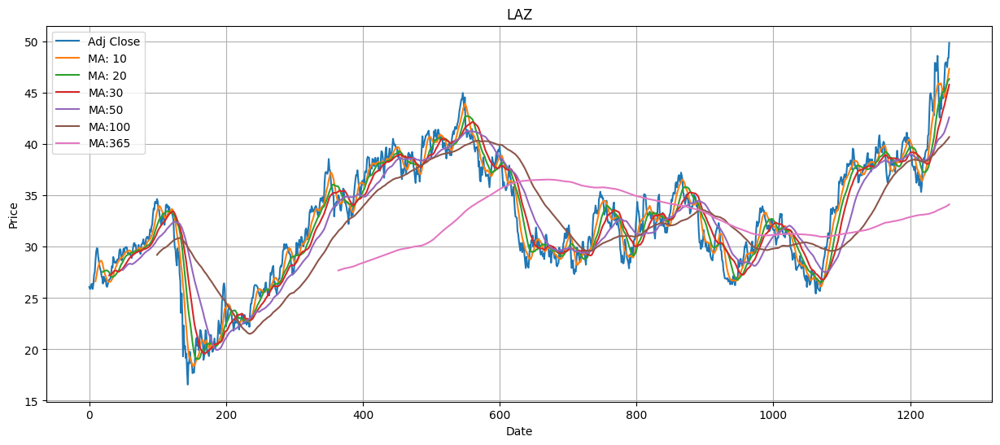

In [78]:
data_list = [GS, JPM, MS, EVR, LAZ]

for i in range(len(data_list)):   
    plot_graphic(data_list[i], company_list[i])

In [79]:
#Data sets for different companies are iterated through in the data_list. A plot_graphic function is invoked for each data set, with the corresponding company data and name provided as input. As a result, distinct graphs are created for each company, which allow visualization of their adjusted closing prices and moving averages.

#As u can see the red line gives more smoothening over blue line, which gives more smoothening over green line.

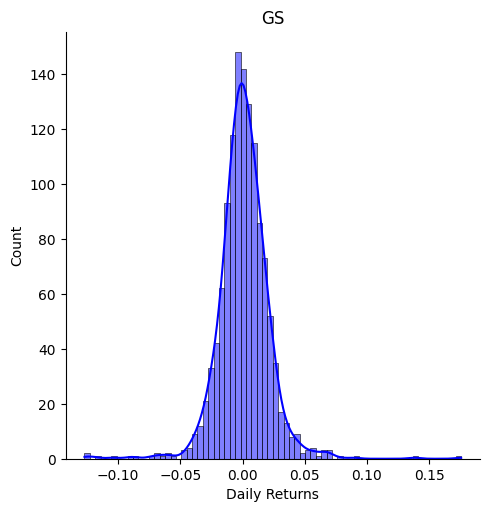

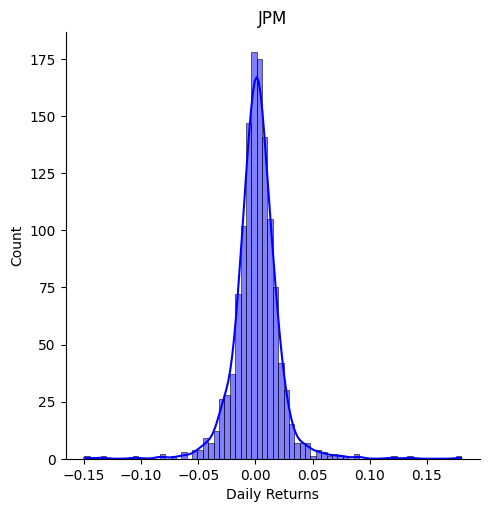

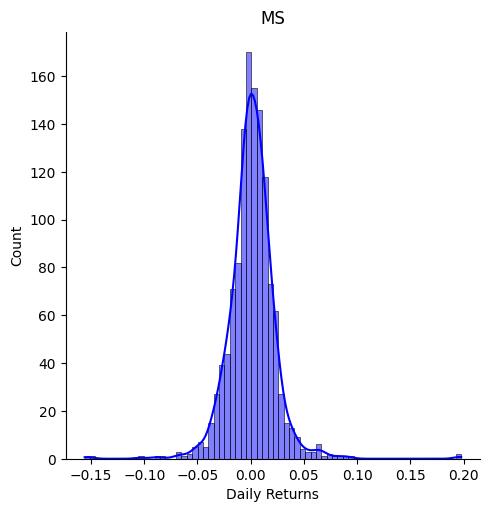

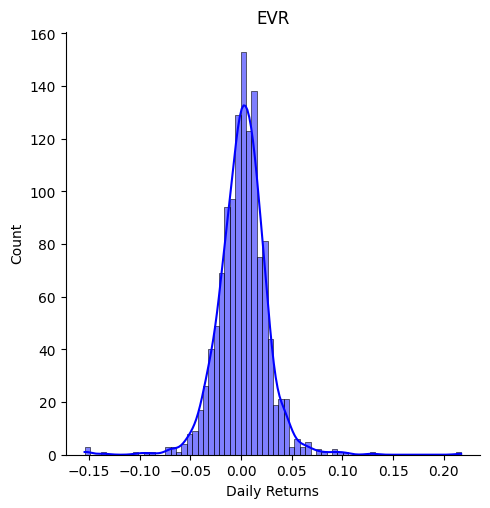

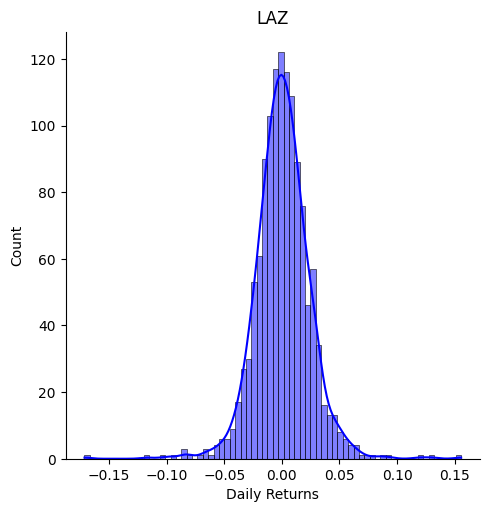

In [82]:
# Calculate returns and draw distribution

for i in range(len(data_list)):
    data_list[i]['Daily Returns'] = data_list[i]['Adj Close'].pct_change()
    sns.displot(data_list[i]['Daily Returns'].dropna(), bins=70, color='blue', kde=True)
    plt.title(company_list[i])
    plt.show()

In [83]:
#This code snippet calculates the daily returns for each company within the data_list and visualizes the distribution of these returns using a histogram.

#On observing we see it follows almost a normal distribution, we say “almost” as the head and tail parts of the histogram (upon which we did smoothening to arrive at this conclusion) don’t follow Gaussian distribution very strictly (why? And how can we say this? I have explained this in my talk of normality section).

#And the smoothening has been achieved due to the usage of moving average, as histogram itself is a discrete distribution and in order to achieve a continuous distribution moving average provides a good means for visualization.

In [86]:
import pandas as pd

# Assuming data_list is a list of dictionaries with 'Daily Returns' as a key and the values are pandas Series
daily_returns_list = [data['Daily Returns'] for data in data_list]

# Concatenate the daily return series along the columns axis
stock_returns = pd.concat(daily_returns_list, axis=1)

# Set the columns names to match the company_list
stock_returns.columns = company_list

# Display the first few rows of the resulting DataFrame
stock_returns.head()

,GS,JPM,MS,EVR,LAZ
0,NaN,NaN,NaN,NaN,NaN
1,-0.007914,-0.010573,-0.009213,-0.016325,-0.008245
2,0.011865,0.010024,0.014828,0.013567,0.001484
3,0.021439,0.022659,0.022536,0.035485,0.016306
4,0.002310,0.005860,0.004844,0.008599,0.001750


In [87]:
#Stock_returns is generated by concatenating the pandas Series objects from daily_returns_list along the columns axis using the pd.concat() function. A combined view of the daily returns data for all of the companies is provided by this DataFrame, in which each column represents the daily returns of a different company.

#Stock_returns.columns = company_list ensures that the column names in stock_returns align with the names of the companies. Lastly, stock_returns.head() is used to display the first few rows of the resulting DataFrame.

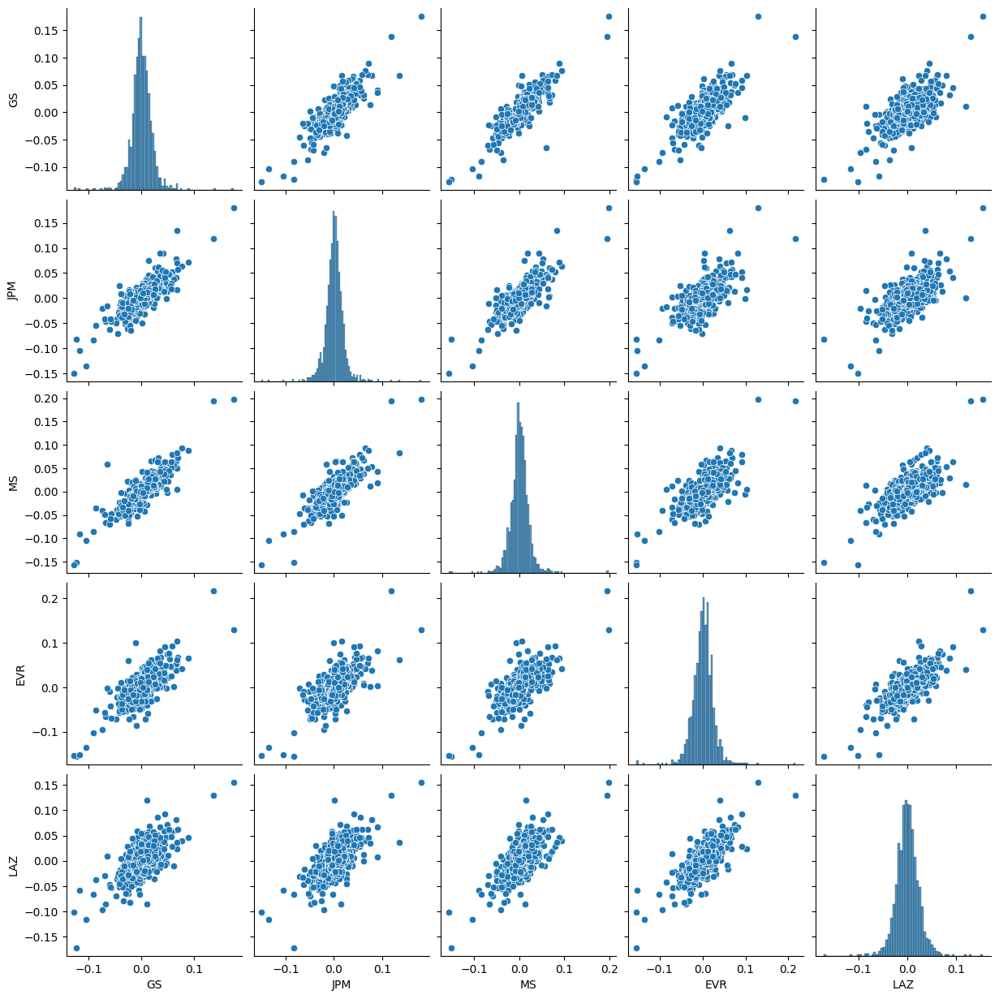

In [88]:
sns.pairplot(stock_returns.dropna())

In [89]:
#Seaborn's pairplot() function is used to create a scatter plot matrix. In this matrix, you can see how variables within the stock_returns DataFrame are related pairwise. Dropna() ensures that data for scatter plots is complete. The resulting plot can provide insight into the correlations and patterns between the daily returns of different companies.

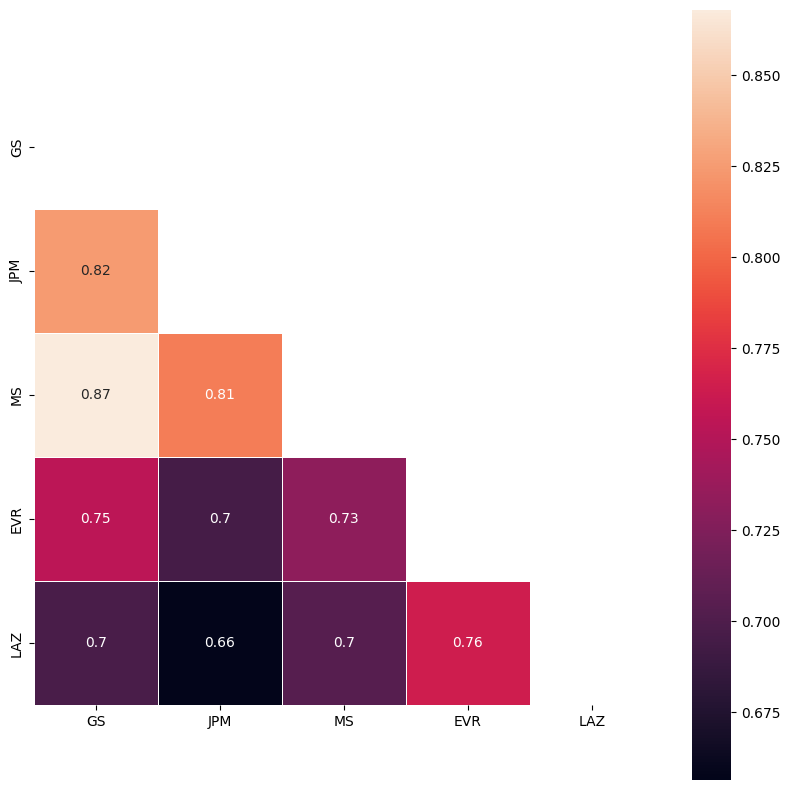

In [90]:
# Build correlation matrix
corr = stock_returns.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(10, 10))
sns.heatmap(corr, mask=mask,  square=True, linewidths=.5, annot=True)
plt.show()

In [91]:
#A heatmap plot is generated to visualize the correlations between stock_returns and the correlation matrix created in the provided code snippet.

In [92]:
mean_income = stock_returns.mean() # Mean income for each stock
cov_returns = stock_returns.cov() # Covariation 
count = len(stock_returns.columns)
print(mean_income, cov_returns, sep='\n')

GS     0.001052
JPM    0.000887
MS     0.001113
EVR    0.001331
LAZ    0.000800
dtype: float64
           GS       JPM        MS       EVR       LAZ
GS   0.000417  0.000339  0.000392  0.000384  0.000340
JPM  0.000339  0.000405  0.000361  0.000349  0.000315
MS   0.000392  0.000361  0.000490  0.000404  0.000372
EVR  0.000384  0.000349  0.000404  0.000622  0.000455
LAZ  0.000340  0.000315  0.000372  0.000455  0.000569


In [93]:
# Function, that generate random shares
def randomPortfolio():
    share = np.exp(np.random.randn(count))
    share = share / share.sum()
    return share

In [94]:
#randomPortfolio() is responsible for generating a random portfolio of shares.

#The randomPortfolio() function generates a random portfolio of shares by drawing random values from a standard normal distribution, exponentiating them to ensure positive values, and then normalizing them to represent proportions of the total portfolio value. By calling this function, you can obtain a random allocation of shares for a portfolio.

In [95]:
def IncomePortfolio(Rand):
    return np.matmul(mean_income.values, Rand)


def RiskPortfolio(Rand):
    return np.sqrt(np.matmul(np.matmul(Rand, cov_returns.values), Rand))

In [96]:
#The provided code includes two functions: IncomePortfolio(Rand) and RiskPortfolio(Rand). These functions are designed to perform calculations related to income and risk for a portfolio.

#the IncomePortfolio(Rand) function calculates the expected income of a portfolio based on the mean income values and the allocation of assets. The RiskPortfolio(Rand) function, on the other hand, calculates the risk of a portfolio based on the covariance matrix of returns and the allocation of assets. Together, these functions provide essential metrics for evaluating the income and risk characteristics of a portfolio

In [107]:
combinations = 11000
risk = np.zeros(combinations)
income = np.zeros(combinations)
portfolio = np.zeros((combinations, count))

# Function, which create new combinations of shares
for i in range(combinations):
    rand = randomPortfolio()

    portfolio[i, :] = rand
    risk[i] = RiskPortfolio(rand)
    income[i] = IncomePortfolio(rand)

In [108]:
#First, the variable "combinations" is initialized to 11000. This variable determines the number of portfolio combinations that will be generated and evaluated

#Next, three arrays named "risk," "income," and "portfolio" are created and initialized with zeros. These arrays will store the risk, income, and portfolio data for each combination.

#The randomly generated portfolio is then assigned to the ith row of the "portfolio" array. Each row in the "portfolio" array represents a different combination of shares.

#The "RiskPortfolio()" function is invoked, passing the current portfolio as an argument. This function calculates the risk associated with the given portfolio.The calculated risk value is assigned to the ith element of the "risk" array.

#The "IncomePortfolio()" function is called with the current portfolio as an argument. This function computes the income or expected return of the portfolio.The calculated income value is then assigned to the ith element of the "income" array.


In [109]:
#The ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk. o.

#The risk-free rate of return is the return on an investment with zero risk, meaning it’s the return investors could expect for taking no risk.

#The optimal risky portfolio is the one with the highest Sharpe ratio.

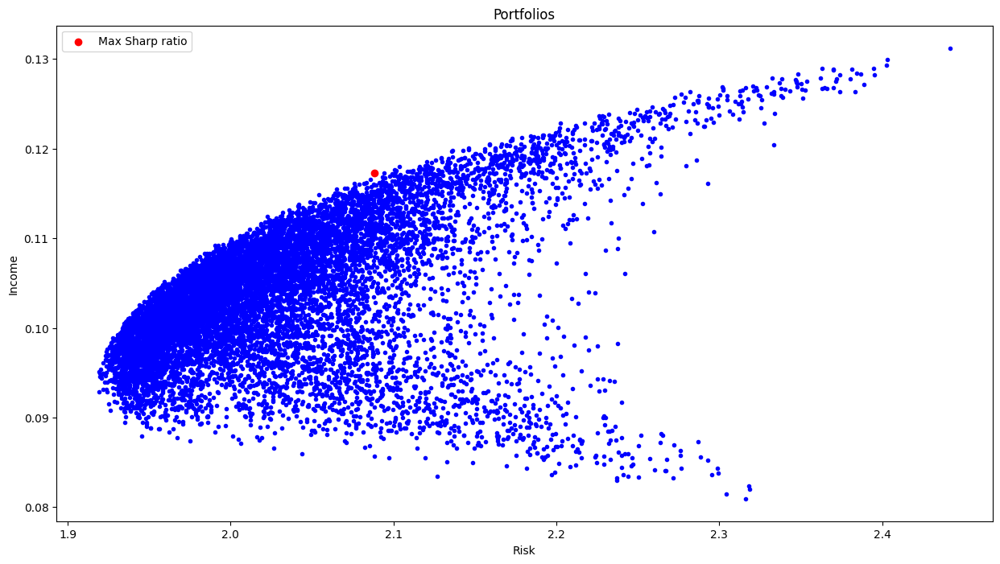

In [110]:
plt.figure(figsize=(15, 8))

plt.scatter(risk * 100, income * 100, c="b", marker=".")
plt.xlabel("Risk")
plt.ylabel("Income")
plt.title("Portfolios")
MaxSharpRatio = np.argmax(income / risk)
plt.scatter([risk[MaxSharpRatio] * 100], [income[MaxSharpRatio] * 100], c="r", marker="o", label="Max Sharp ratio")

plt.legend()
plt.show()

In [111]:
#The above plot generates a scatter plot where the x-axis represents the risk and the y-axis represents the income for multiple portfolios. It further highlights the portfolio with the maximum Sharpe ratio by adding a red dot at its corresponding risk and income values and including a legend to identify it.

In [112]:
#Below we find the best portfolio out of all

In [113]:
best_port = portfolio[MaxSharpRatio]
for i in range(len(company_list)):
    print("{} : {}".format(company_list[i], best_port[i]))

GS : 0.3085641495092513
JPM : 0.0335219837817813
MS : 0.24289299128193048
EVR : 0.4076560675846744
LAZ : 0.0073648078423624655


In [114]:
#It identifies the portfolio with the highest Sharpe ratio and then displays the allocation or weight assigned to each company in that portfolio. It allows us to see how the assets or companies are distributed within the best-performing portfolio.

In [115]:
days = 365
dt = 1 / days
# here I have divided by 365 but usually we do by 252 (the number of trading days)
stock_returns.dropna(inplace=True)

mu = stock_returns.mean()
sigma = stock_returns.std()

In [116]:
#It calculates the average daily returns (mu) and the standard deviation of daily returns (sigma) for a stock based on the available data. These values are commonly used in financial analysis and risk assessment to understand the historical performance and volatility of a stock.

In [117]:
def monte_carlo(start_price, days, mu, sigma):
    price = np.zeros(days)
    price[0] = start_price
    
    shock = np.zeros(days)
    drift = np.zeros(days)
    
    for x in range(1, days):
        shock[x] = np.random.normal(loc=mu * dt, scale=sigma*np.sqrt(dt))
        drift[x] = mu * dt
        
        price[x] = price[x-1] + (price[x-1] * (drift[x] + shock[x]))
        
    return price

In [118]:
#The provided code snippet introduces a function named monte_carlo that employs the Monte Carlo method to simulate the future price of a stock.

#The monte_carlo function uses the Monte Carlo method to generate simulated stock prices for a specified number of days. It considers the initial stock price, average daily return, and standard deviation of daily returns. The function incorporates random shocks and drift components to calculate the simulated prices for each day.

#For the generation of random paths, I have used arithmetic Brownian motion, instead of this one can use geometric Brownian motion too.

#The more the variance the more the spread is, and the less the steepness is.In context to Monte Carlo Simulation, the random paths generated would be less differentiating if the variance is less and it would be more if the variance is more resulting in a flatter curve.

Text(0.5, 1.0, 'Monte Carlo analysis for Goldman Sachs')

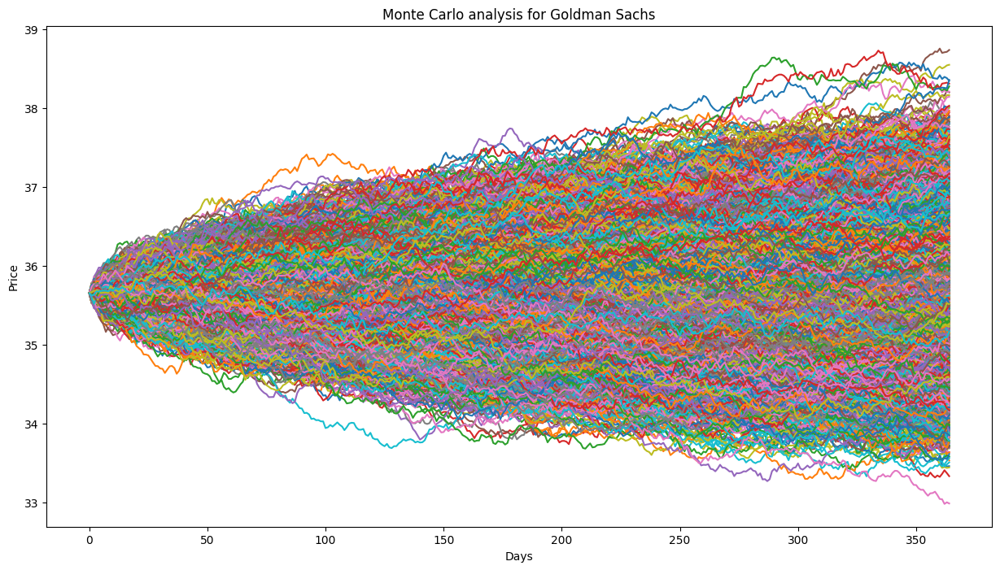

In [120]:
start_price = 35.65
sim = np.zeros(10000)

plt.figure(figsize=(15, 8))
for i in range(10000):
    result = monte_carlo(start_price, days, mu['GS'], sigma['GS'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Goldman Sachs')

In [121]:
#This code performs a Monte Carlo analysis of Twitter's stock by predicting its future prices through 1000 simulations. The final prices from these simulations are stored in the 'sim' array and plotted. By doing so, the code offers potential insights into the future price range of Twitter's stock, as determined by the Monte Carlo simulations.

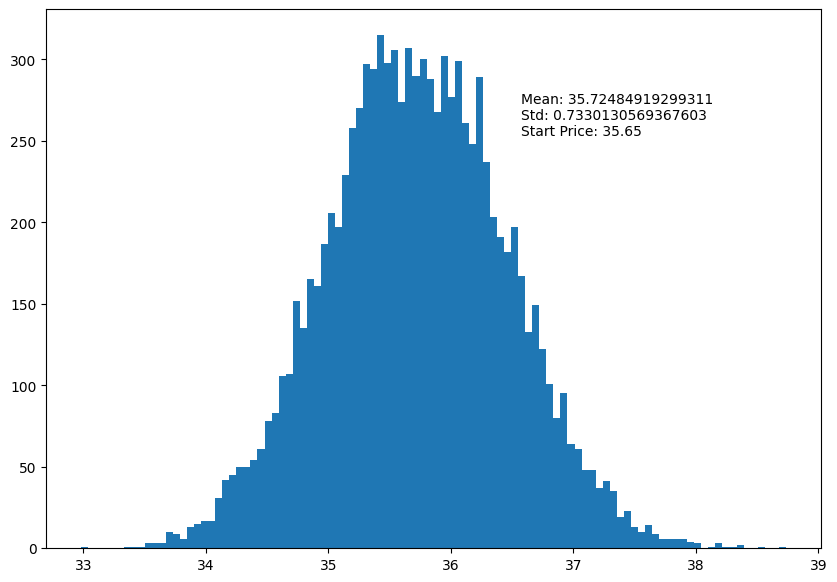

In [122]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

In [123]:
#The provided code constructs a histogram to illustrate the distribution of the Twitter stock's simulated prices derived from the Monte Carlo simulations.

Text(0.5, 1.0, 'Monte Carlo analysis for JP Morgan')

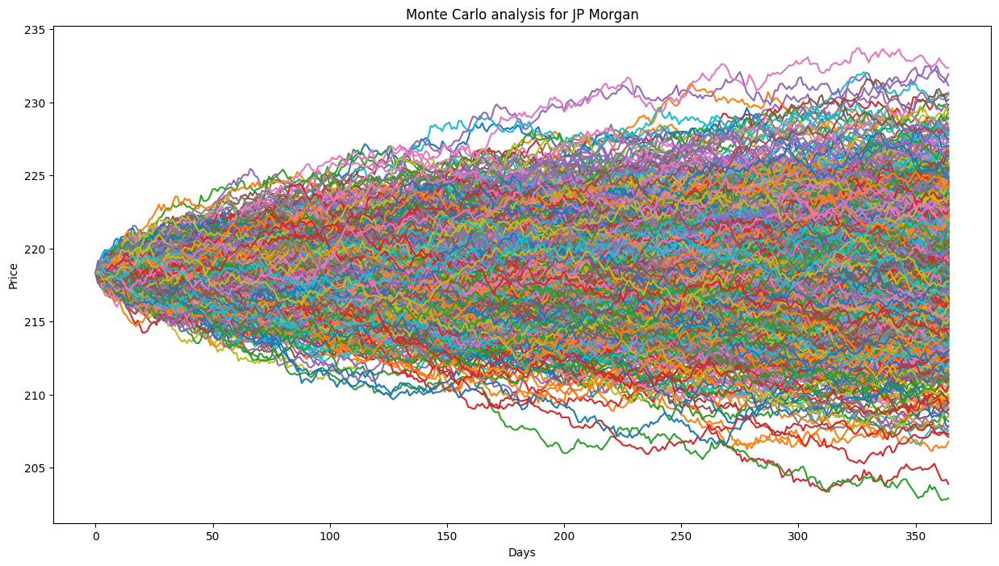

In [127]:
start_price = 218.31
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['JPM'], sigma['JPM'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for JP Morgan')

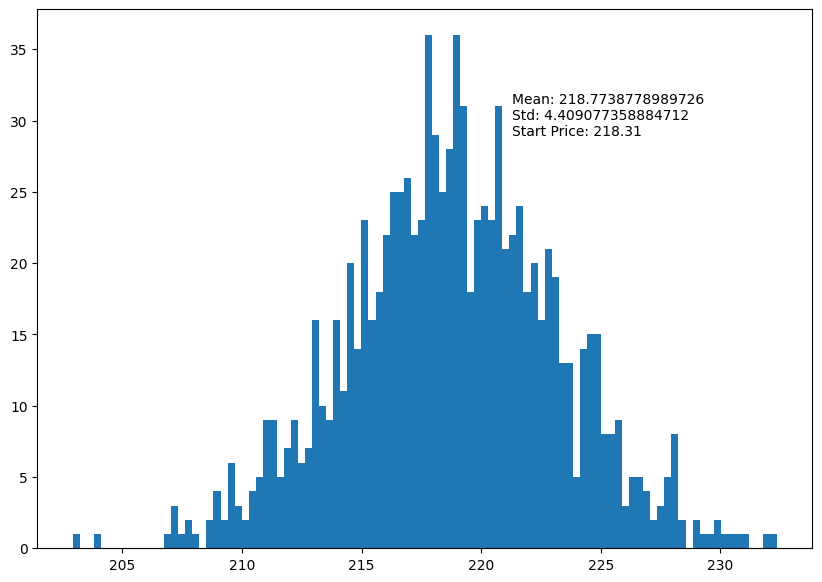

In [128]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Morgan Stanley ')

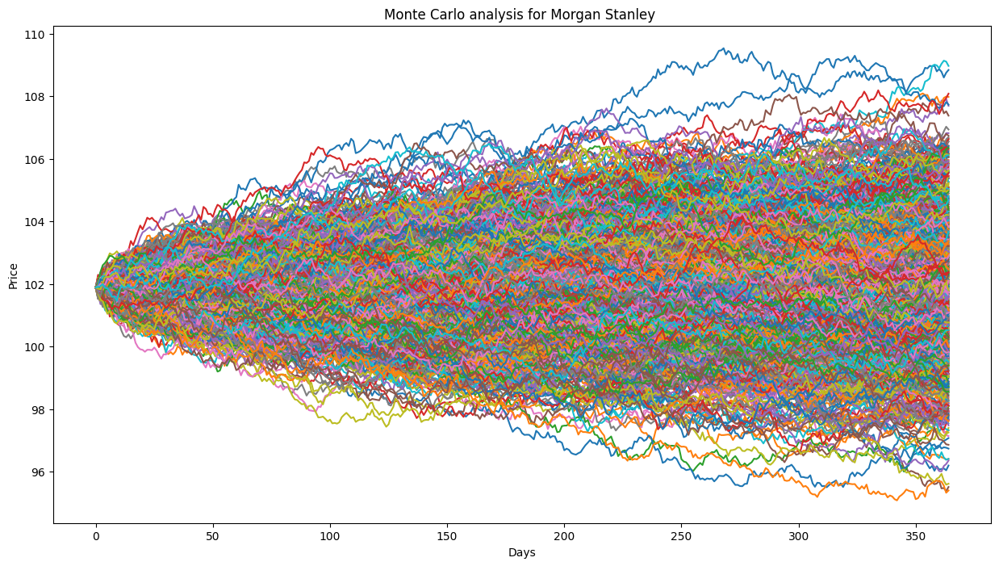

In [129]:
start_price = 101.89
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['MS'], sigma['MS'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Morgan Stanley ')

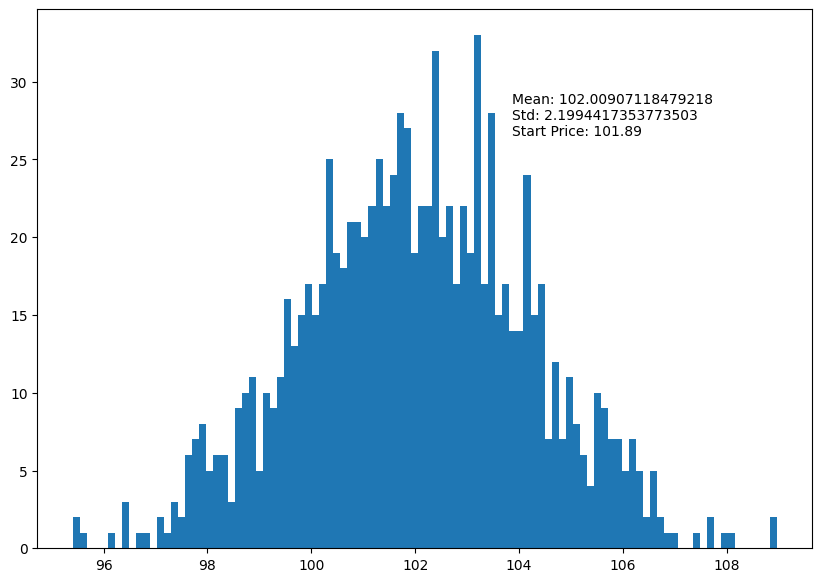

In [130]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Evercare')

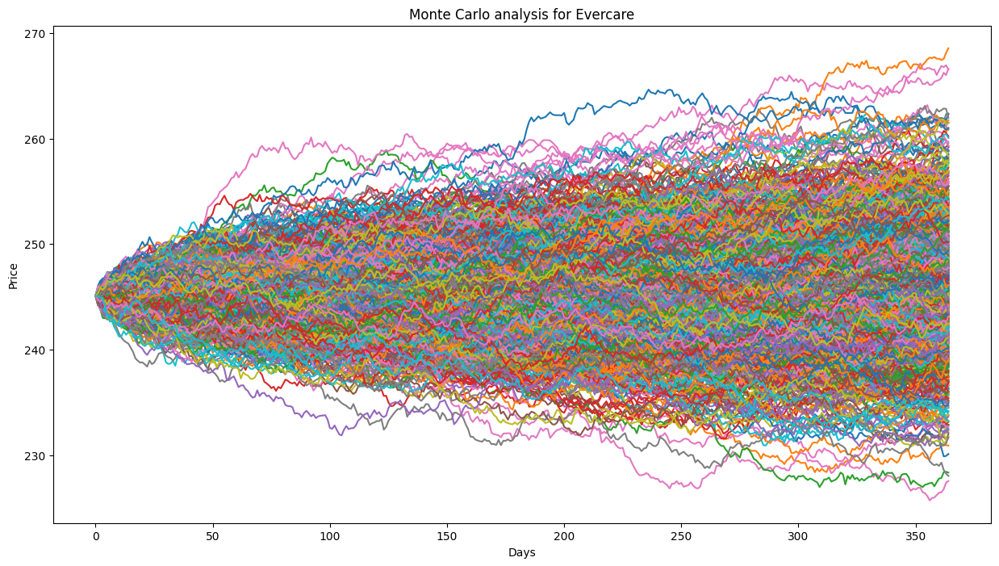

In [133]:
start_price = 245.09
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['EVR'], sigma['EVR'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Evercare')

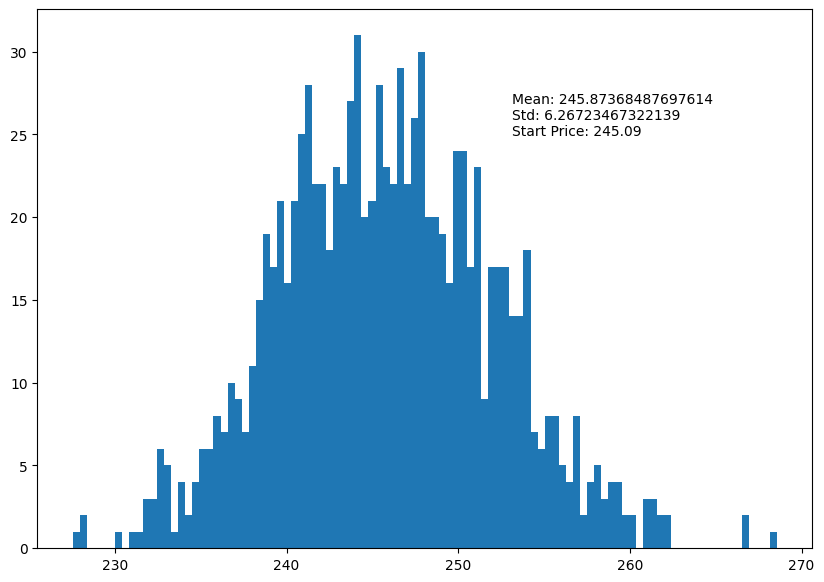

In [134]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Evercare')

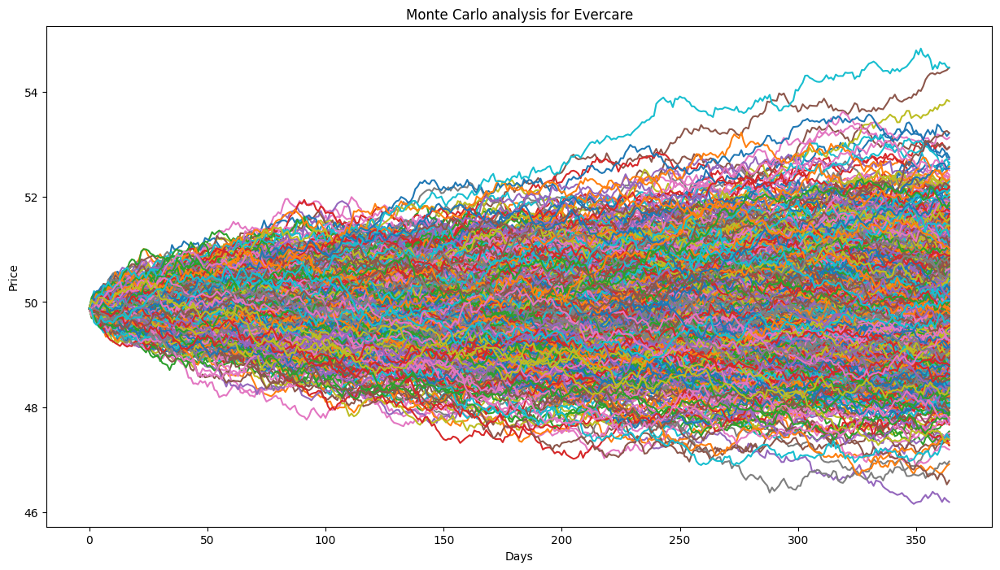

In [135]:
start_price = 49.88
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['LAZ'], sigma['LAZ'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Evercare')

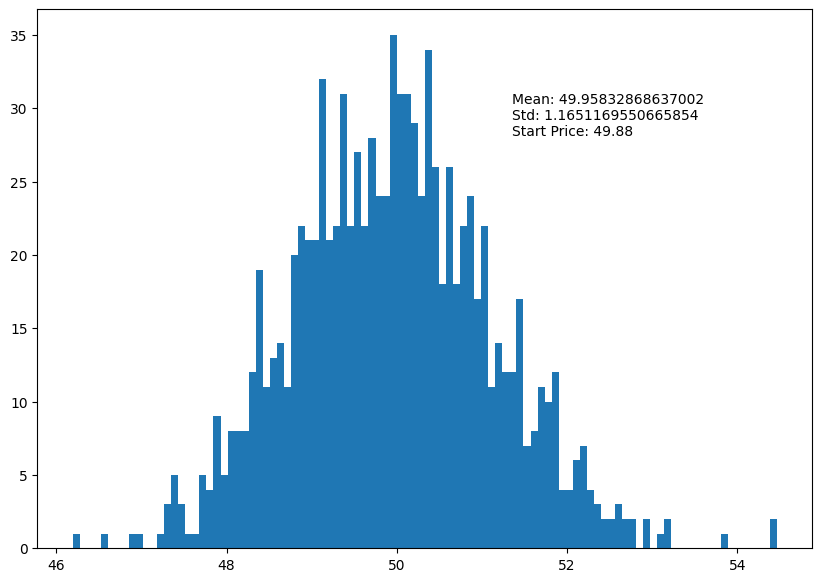

In [136]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

In [137]:
#We did the same analysis for other Ivestment firms as well, which we discussed in detail in Goldman Sachs 

In [138]:
#We can also extend this discussion to include risk factor along with it to incorporate more diversity

In [149]:
# lets import more data
df = yf.download(['SBIN.NS', 'HDFCBANK.NS', 'PNB.BO', 'AXISBANK.NS'], start='2023-08-24', end='2024-08-25')
df.head()

[*********************100%***********************]  4 of 4 completed


Price                       Adj Close                                      \
Ticker                    AXISBANK.NS  HDFCBANK.NS     PNB.BO     SBIN.NS   
Date                                                                        
2023-08-24 00:00:00+00:00  980.593201  1558.024536  62.076809  567.434326   
2023-08-25 00:00:00+00:00  982.341858  1540.464233  60.831516  560.549805   
2023-08-28 00:00:00+00:00  989.436401  1556.495361  61.770428  563.401917   
2023-08-29 00:00:00+00:00  979.943726  1568.876343  62.244823  565.368958   
2023-08-30 00:00:00+00:00  982.591675  1557.432495  62.709339  558.041870   

Price                           Close                                      \
Ticker                    AXISBANK.NS  HDFCBANK.NS     PNB.BO     SBIN.NS   
Date                                                                        
2023-08-24 00:00:00+00:00  981.349976  1579.300049  62.810001  576.950012   
2023-08-25 00:00:00+00:00  983.099976  1561.500000  61.549999  569.950012   
2023-08-28 00:00:00+00:00  990.200012  1577.750000  62.500000  572.849976   
2023-08-29 00:00:00+00:00  980.700012  1590.300049  62.980000  574.849976   
2023-08-30 00:00:00+00:00  983.349976  1578.699951  63.450001  567.400024   

Price                            High               ...        Low  \
Ticker                    AXISBANK.NS  HDFCBANK.NS  ...     PNB.BO   
Date                                                ...              
2023-08-24 00:00:00+00:00  994.250000  1596.199951  ...  62.400002   
2023-08-25 00:00:00+00:00  988.200012  1577.500000  ...  61.130001   
2023-08-28 00:00:00+00:00  992.500000  1582.650024  ...  61.349998   
2023-08-29 00:00:00+00:00  991.000000  1592.650024  ...  62.480000   
2023-08-30 00:00:00+00:00  998.000000  1603.949951  ...  62.820000   

Price                                        Open                          \
Ticker                        SBIN.NS AXISBANK.NS  HDFCBANK.NS     PNB.BO   
Date                                                                        
2023-08-24 00:00:00+00:00  575.549988  984.799988  1593.300049  63.560001   
2023-08-25 00:00:00+00:00  567.200012  974.000000  1574.550049  62.349998   
2023-08-28 00:00:00+00:00  569.200012  980.099976  1561.500000  61.750000   
2023-08-29 00:00:00+00:00  571.849976  990.200012  1589.699951  62.810001   
2023-08-30 00:00:00+00:00  566.099976  983.000000  1603.949951  62.820000   

Price                                      Volume                         \
Ticker                        SBIN.NS AXISBANK.NS HDFCBANK.NS     PNB.BO   
Date                                                                       
2023-08-24 00:00:00+00:00  578.150024    11899556    21572896  4043307.0   
2023-08-25 00:00:00+00:00  573.799988     6228241    15034878  2437429.0   
2023-08-28 00:00:00+00:00  572.799988     8451441    14433619  3550300.0   
2023-08-29 00:00:00+00:00  573.650024     8114141    17769466  2407757.0   
2023-08-30 00:00:00+00:00  576.700012     9023083    14042102  3526922.0   

Price                                
Ticker                      SBIN.NS  
Date                                 
2023-08-24 00:00:00+00:00  24131644  
2023-08-25 00:00:00+00:00  12271885  
2023-08-28 00:00:00+00:00   9711932  
2023-08-29 00:00:00+00:00  13144855  
2023-08-30 00:00:00+00:00  15281416  

[5 rows x 24 columns]

In [150]:
#To understand the columns and distribution of the dataframe

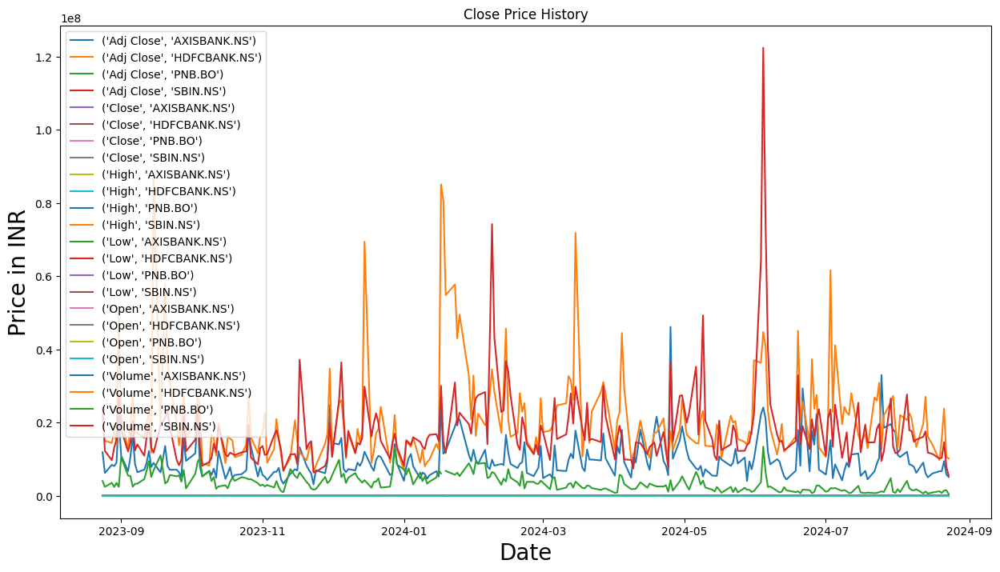

In [151]:
# Closing Price History
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(df)
plt.title('Close Price History')
plt.xlabel('Date',fontsize =20)
plt.ylabel('Price in INR',fontsize = 20)
ax.legend(df.columns.values)
plt.show()

In [152]:
# Adjusted Closing price
df = df['Adj Close']
df.head()

Ticker,AXISBANK.NS,HDFCBANK.NS,PNB.BO,SBIN.NS
Date,,,,
2023-08-24 00:00:00+00:00,980.593201,1558.024536,62.076809,567.434326
2023-08-25 00:00:00+00:00,982.341858,1540.464233,60.831516,560.549805
2023-08-28 00:00:00+00:00,989.436401,1556.495361,61.770428,563.401917
2023-08-29 00:00:00+00:00,979.943726,1568.876343,62.244823,565.368958
2023-08-30 00:00:00+00:00,982.591675,1557.432495,62.709339,558.041870


In [153]:
#To understand the columns and distribution of the dataframe

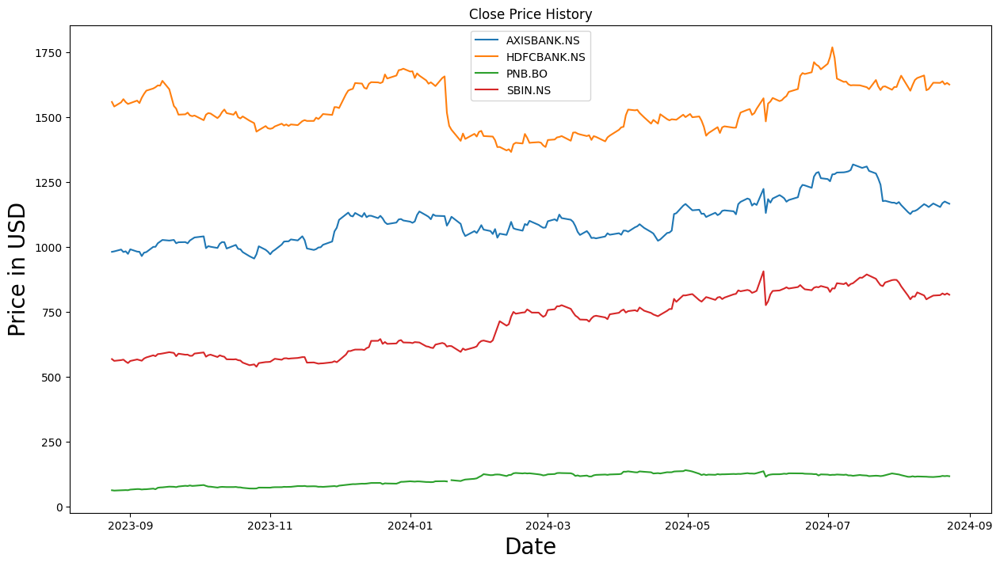

In [154]:
# Closing Price History
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(df)
plt.title('Close Price History')
plt.xlabel('Date',fontsize =20)
plt.ylabel('Price in USD',fontsize = 20)
ax.legend(df.columns.values)
plt.show()

In [155]:
#Plot to understand the adjusted closing price of all the assets

In [158]:
# Log of percentage change
cov_matrix = df.pct_change().apply(lambda x: np.log(1+x)).cov()
cov_matrix

C:\Users\harsh\AppData\Local\Temp\ipykernel_24648\2377367049.py:2: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



Ticker,AXISBANK.NS,HDFCBANK.NS,PNB.BO,SBIN.NS
Ticker,,,,
AXISBANK.NS,0.000236,0.000081,0.000166,0.000152
HDFCBANK.NS,0.000081,0.000191,0.000093,0.000089
PNB.BO,0.000166,0.000093,0.000623,0.000308
SBIN.NS,0.000152,0.000089,0.000308,0.000325


In [159]:
# Yearly returns for individual companies
ind_er = df.resample('YE').last().pct_change().mean()
ind_er

Ticker
AXISBANK.NS    0.058559
HDFCBANK.NS   -0.036279
PNB.BO         0.227398
SBIN.NS        0.291213
dtype: float64

In [160]:
#Above we find the yearly returns for all the assets choosen

In [163]:
# Volatility is given by the annual standard deviation. 
# We multiply by 252 because there are 252 trading days/year.
ann_sd = df.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(252))
ann_sd

C:\Users\harsh\AppData\Local\Temp\ipykernel_24648\1650487477.py:3: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



Ticker
AXISBANK.NS    0.243627
HDFCBANK.NS    0.219445
PNB.BO         0.396320
SBIN.NS        0.286120
dtype: float64

In [164]:
assets = pd.concat([ind_er, ann_sd], axis=1) # Creating a table for visualising returns and volatility of assets
assets.columns = ['Returns', 'Volatility']
assets

,Returns,Volatility
Ticker,,
AXISBANK.NS,0.058559,0.243627
HDFCBANK.NS,-0.036279,0.219445
PNB.BO,0.227398,0.396320
SBIN.NS,0.291213,0.286120


In [165]:
#Volatility and Returns for all the assets have been found above

In [166]:
p_ret = [] # Define an empty array for portfolio returns
p_vol = [] # Define an empty array for portfolio volatility
p_weights = [] # Define an empty array for asset weights

num_assets = len(df.columns)
num_portfolios = 10000

In [167]:
for portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights = weights/np.sum(weights)
    p_weights.append(weights)
    returns = np.dot(weights, ind_er) # Returns are the product of individual expected returns of asset and its 
                                      # weights 
    p_ret.append(returns)
    var = cov_matrix.mul(weights, axis=0).mul(weights, axis=1).sum().sum()# Portfolio Variance
    sd = np.sqrt(var) # Daily standard deviation
    ann_sd = sd*np.sqrt(250) # Annual standard deviation = volatility
    p_vol.append(ann_sd)

In [168]:
data = {'Returns':p_ret, 'Volatility':p_vol}

for counter, symbol in enumerate(df.columns.tolist()):
    #print(counter, symbol)
    data[symbol+' weight'] = [w[counter] for w in p_weights]

In [169]:
portfolios=pd.DataFrame(data)                        
portfolios.head() # Dataframe of the 100000 portfolios created

,Returns,Volatility,AXISBANK.NS weight,HDFCBANK.NS weight,PNB.BO weight,SBIN.NS weight
0,0.085735,0.196325,0.284575,0.403443,0.111982,0.200000
1,0.181724,0.238833,0.431190,0.001598,0.135513,0.431699
2,0.157346,0.217726,0.273619,0.196571,0.091401,0.438409
3,0.082510,0.212058,0.570214,0.198475,0.173026,0.058285
4,0.085451,0.195505,0.240064,0.438289,0.099879,0.221768


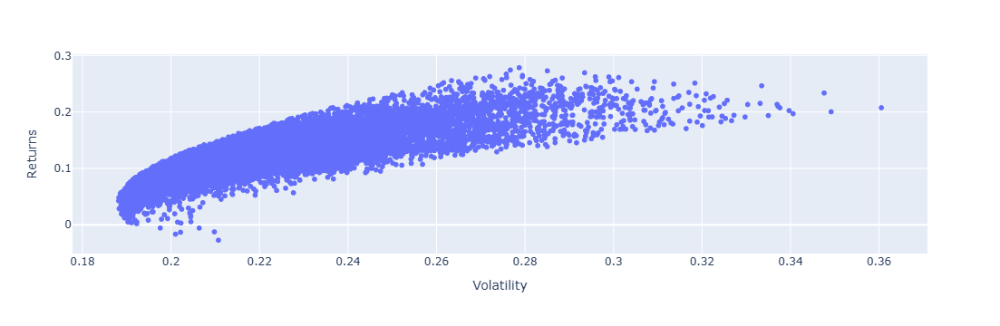

In [170]:
# Ploting efficient frontier
portfolios.plot.scatter(x='Volatility', y='Returns')

In [171]:
min_vol_port = portfolios.iloc[portfolios['Volatility'].idxmin()]
# idxmin() gives us the minimum value in the column specified.                               
min_vol_port

Returns               0.042373
Volatility            0.188177
AXISBANK.NS weight    0.300888
HDFCBANK.NS weight    0.544203
PNB.BO weight         0.009642
SBIN.NS weight        0.145266
Name: 6617, dtype: float64

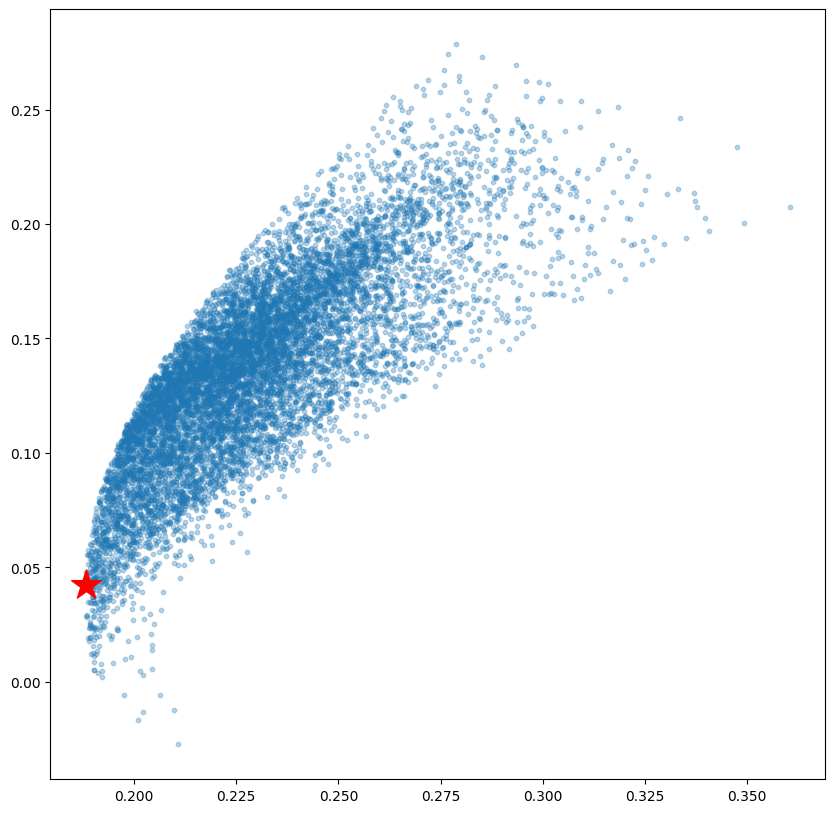

In [172]:
# plotting the minimum volatility portfolio
plt.subplots(figsize=[10,10])
plt.scatter(portfolios['Volatility'], portfolios['Returns'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port.iloc[1], min_vol_port.iloc[0], color='r', marker='*', s=500)

In [173]:
# Finding the optimal portfolio
rf = 0.01 # risk factor
optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
optimal_risky_port

Returns               0.278577
Volatility            0.278679
AXISBANK.NS weight    0.026664
HDFCBANK.NS weight    0.009639
PNB.BO weight         0.051335
SBIN.NS weight        0.912363
Name: 3041, dtype: float64

In [174]:
#Above is the weights associated with each asset of portfolio

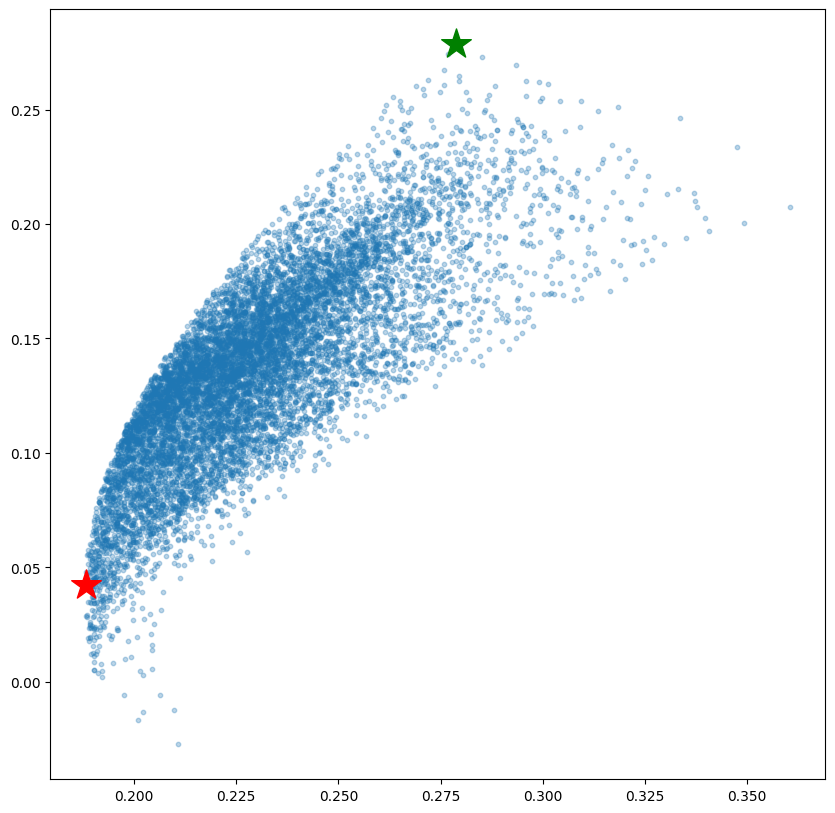

In [175]:
# Plotting optimal portfolio
plt.subplots(figsize=(10, 10))
plt.scatter(portfolios['Volatility'], portfolios['Returns'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port.iloc[1], min_vol_port.iloc[0], color='r', marker='*', s=500)
plt.scatter(optimal_risky_port.iloc[1], optimal_risky_port.iloc[0], color='g', marker='*', s=500)